## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

        Row No Date received                  Product  \
446       6874      09/09/16              Payday loan   
713      10840      08/07/15            Consumer Loan   
803      12248      08/07/16            Consumer Loan   
1153     17162      05/26/16            Consumer Loan   
1185     17642      11/05/15            Consumer Loan   
...        ...           ...                      ...   
126588  222826      09/21/16  Bank account or service   
126589  142174      03/05/16  Bank account or service   
126590   55888      01/23/17  Bank account or service   
126591  293505      09/27/16  Bank account or service   
126592  327087      09/28/15  Bank account or service   

                       Sub-product                                     Issue  \
446                           None  Charged fees or interest I didn't expect   
713                   Vehicle loan       Problems when you are unable to pay   
803                   Vehicle loan                Managing the loan or leas

## One hot encoding and concatenating

In [2]:
vectors = model.docvecs.vectors_docs

In [3]:

one_hot = pd.Categorical(df['Sub-product'])
df_dummies = pd.get_dummies(one_hot)

one_hot2 = pd.Categorical(df['Product'])
df_dummies2 = pd.get_dummies(one_hot)

v_df = pd.DataFrame(vectors)
df_concat = pd.concat([v_df, df_dummies, df_dummies2], axis = 1)
print(df_concat.shape)

(58035, 144)


## Applying T-SNE

In [4]:
tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_concat)


In [5]:
print(data_reduced.shape)

(58035, 2)


## Applying k-means

In [6]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


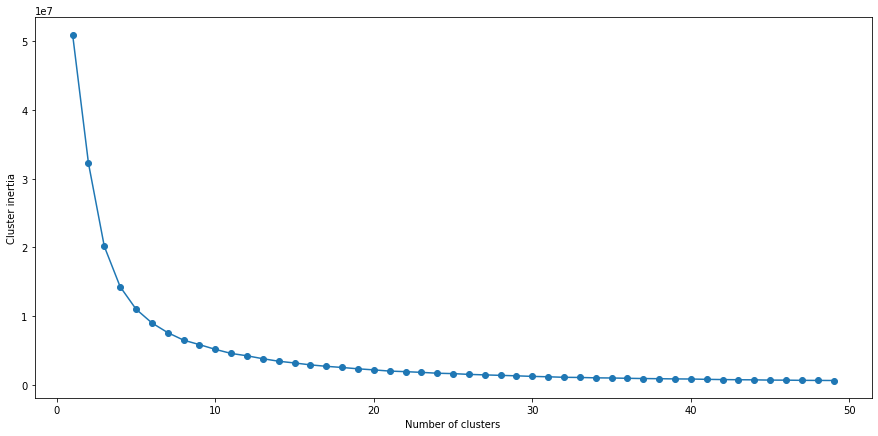

In [7]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.4151844
For n_clusters = 5 The average silhouette_score is : 0.4154265
For n_clusters = 6 The average silhouette_score is : 0.40975702
For n_clusters = 7 The average silhouette_score is : 0.41939315
For n_clusters = 8 The average silhouette_score is : 0.4239702
For n_clusters = 9 The average silhouette_score is : 0.4288521
For n_clusters = 10 The average silhouette_score is : 0.43068376
For n_clusters = 11 The average silhouette_score is : 0.4319555
For n_clusters = 12 The average silhouette_score is : 0.4450354
For n_clusters = 13 The average silhouette_score is : 0.45003182
For n_clusters = 14 The average silhouette_score is : 0.45327756
For n_clusters = 15 The average silhouette_score is : 0.45446214
For n_clusters = 16 The average silhouette_score is : 0.46913922
For n_clusters = 17 The average silhouette_score is : 0.47687915
For n_clusters = 18 The average silhouette_score is : 0.48168865
For n_clusters = 19 The average silho

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 24 The average silhouette_score is : 0.48571005


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 25 The average silhouette_score is : 0.49760965


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 26 The average silhouette_score is : 0.496504


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 27 The average silhouette_score is : 0.4980652


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 28 The average silhouette_score is : 0.5048396


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 29 The average silhouette_score is : 0.51344216


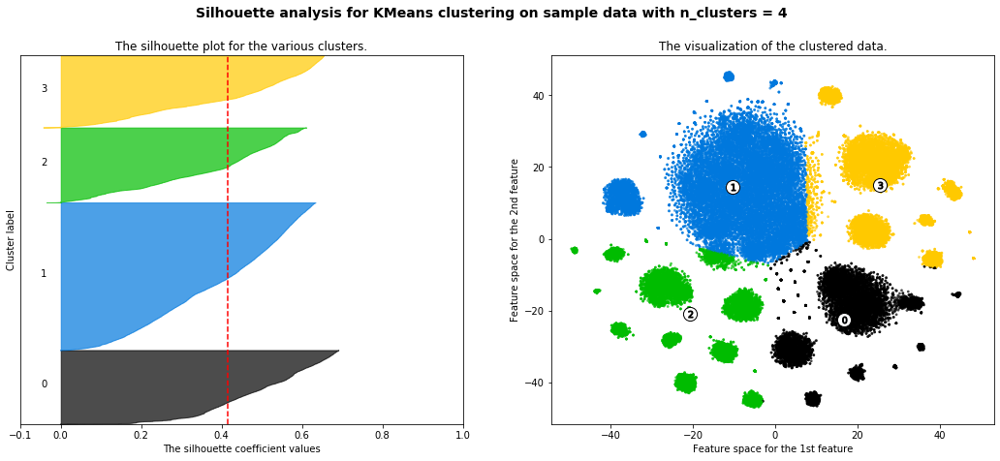

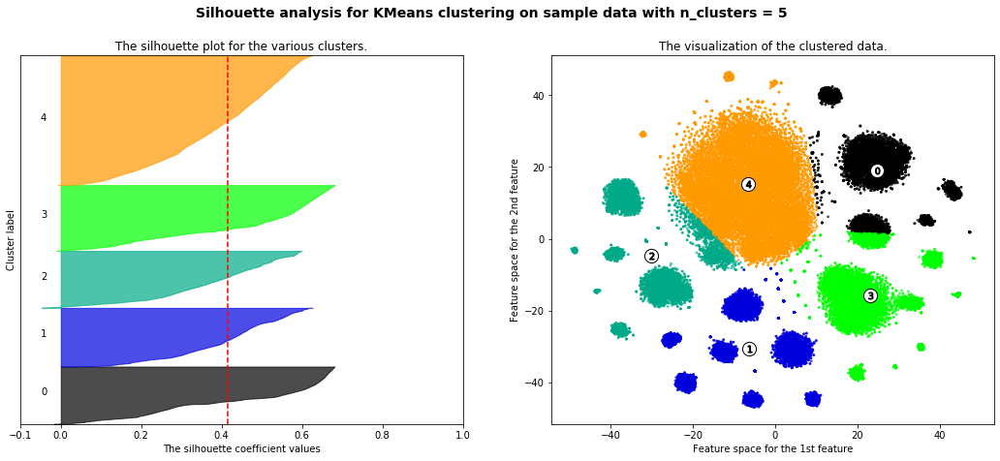

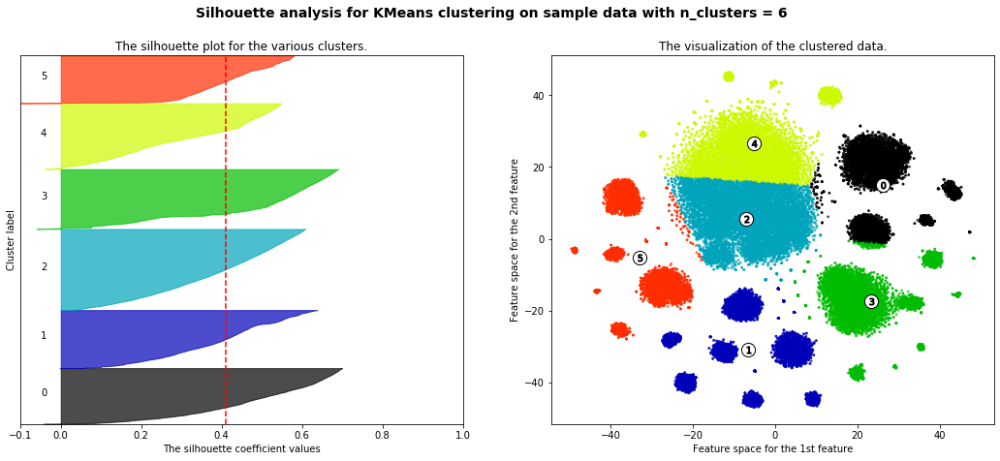

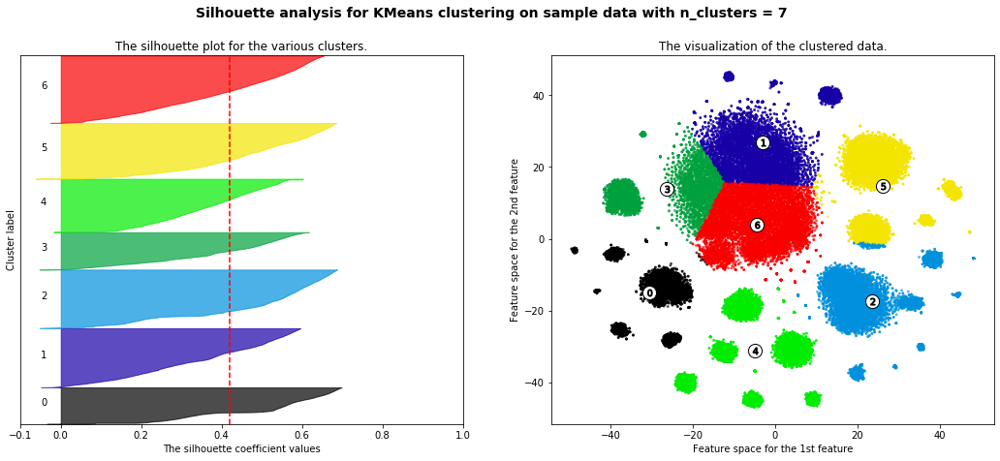

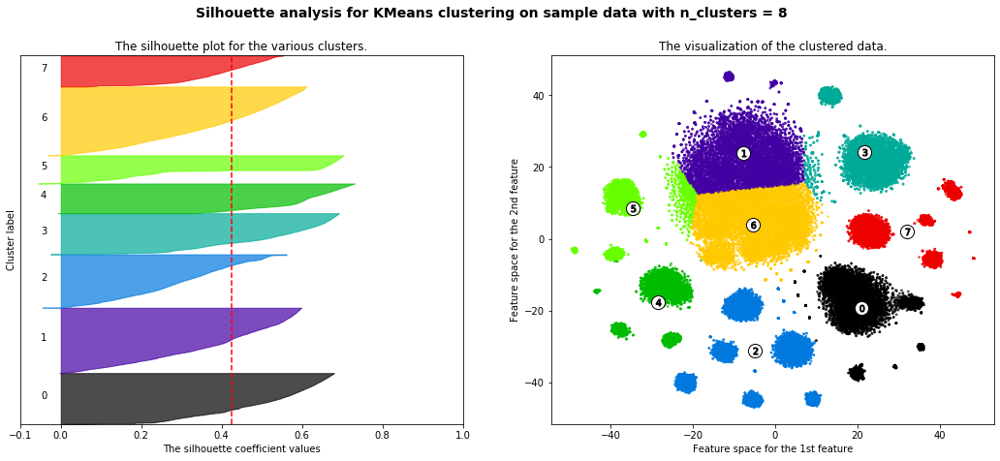

...

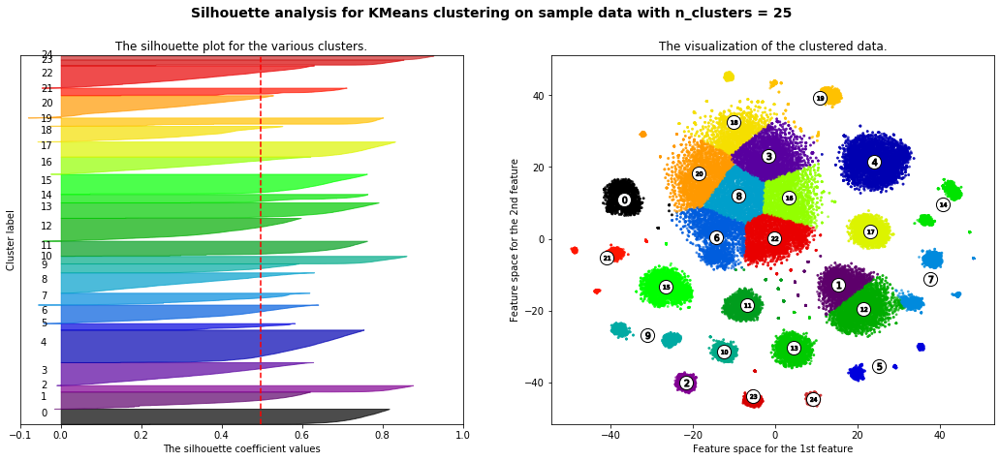

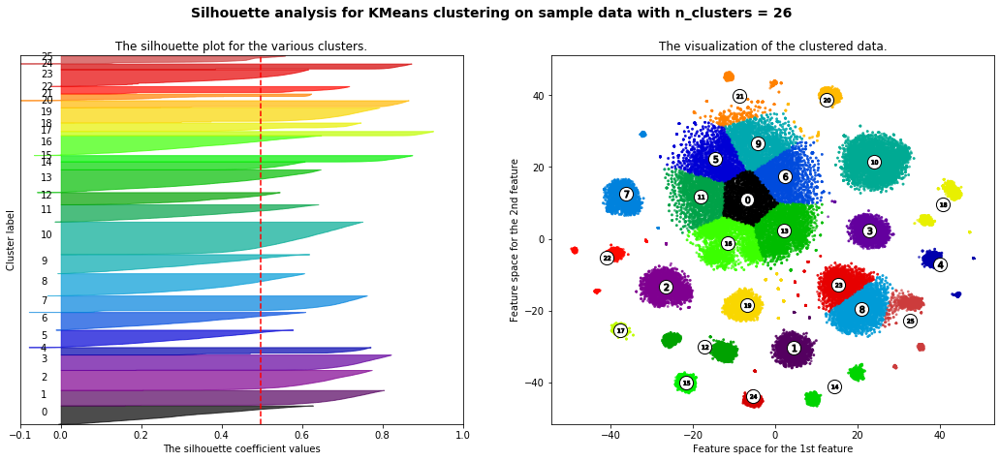

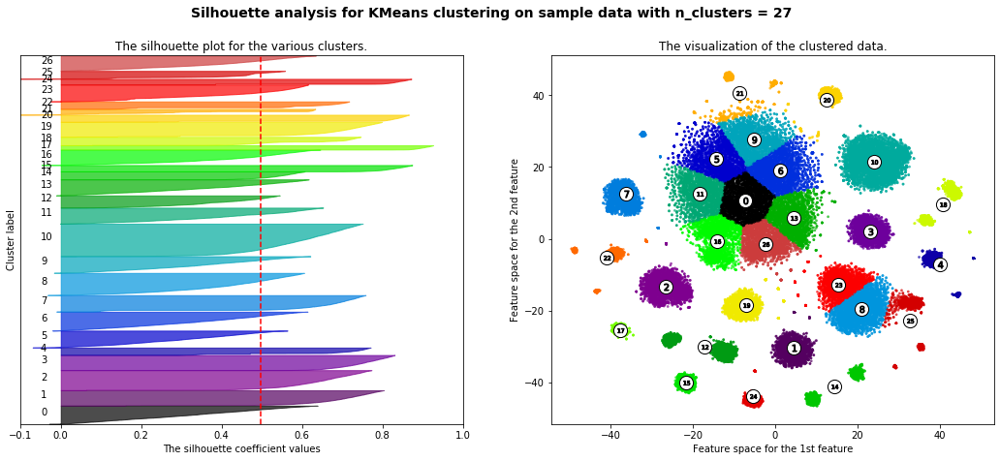

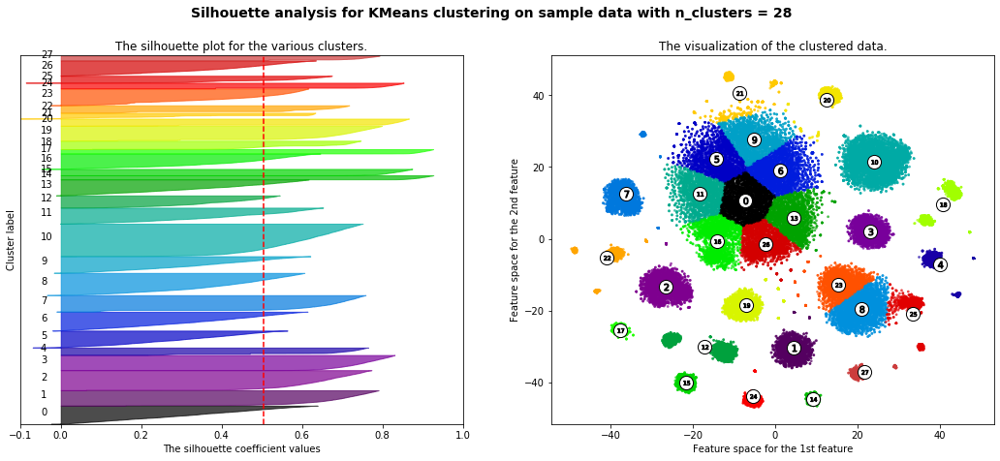

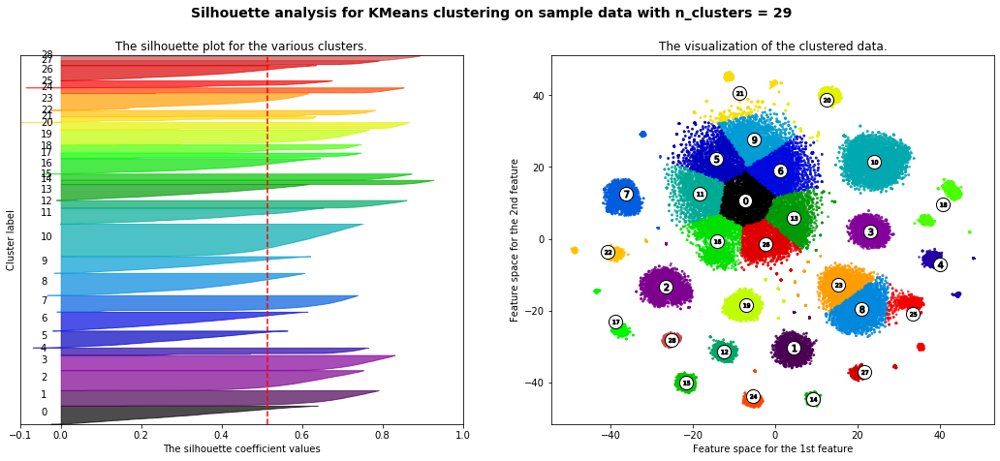

In [8]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,30):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing with narrative

In [11]:
number_clusters = 29
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

df_index = pd.DataFrame(indexes)

indici = []
for i in range(0,len(indexes)):
    indici.append(i)
df1 = df_index.set_index(pd.Index(indici))
df2 = df.set_index(pd.Index(indici))
df_result = pd.concat([df1,df2], axis = 1)
print(df_result)

        0  Row No Date received                  Product  \
0       1    6874      09/09/16              Payday loan   
1      25   10840      08/07/15            Consumer Loan   
2       4   12248      08/07/16            Consumer Loan   
3       4   17162      05/26/16            Consumer Loan   
4      25   17642      11/05/15            Consumer Loan   
...    ..     ...           ...                      ...   
58030   7  222826      09/21/16  Bank account or service   
58031   7  142174      03/05/16  Bank account or service   
58032  27   55888      01/23/17  Bank account or service   
58033   6  293505      09/27/16  Bank account or service   
58034   7  327087      09/28/15  Bank account or service   

                      Sub-product                                     Issue  \
0                            None  Charged fees or interest I didn't expect   
1                    Vehicle loan       Problems when you are unable to pay   
2                    Vehicle loan         

Cluster number: 0
due to deaths in the family and a personal hardship caused by my wife s car accident which has caused a decrease in our family s income and my recent out of the we have temporary falling behind on our mortgage my wife and i have been dealing in good faith with wells fargo and providing all requested documents in a timely manner we have been most diligent in following up with wells fargo to check the status of our loan modification application and we feel that wells fargo has not been cooperating with us as we look to achieve a mutually beneficial resolution our goal is to keep our loan obligation and secure a mutually agreeable loan modification solution so that my wife and i can continue to raise our sons in our home we appreciate the opportunity to work together with wells fargo so that both they and my family can benefit i ve faithfully served in the for ten and half years and i would greatly appreciate wells fargo cooperated with me as we are now coming out of thi

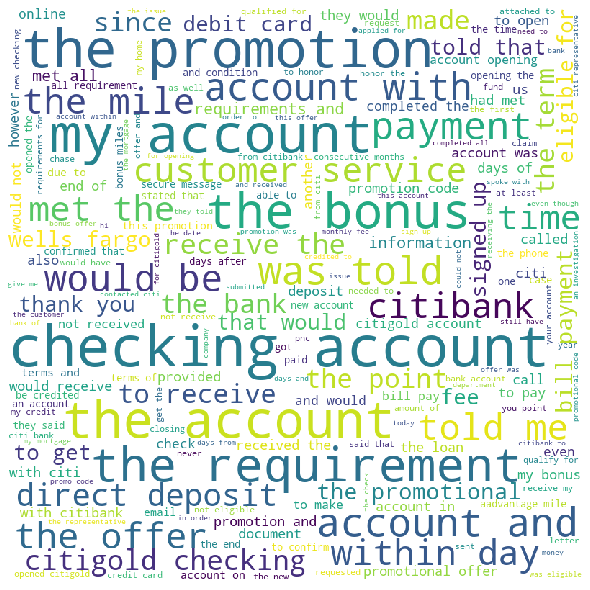

Cluster number: 1
i was told by the active hours app which is a payday loan app to submit a complaint here i was charge by my bank on the wrong day to get a overdraft fee they told my bank to charge me on monday since friday is a bank holiday but instead charge me on friday my bank is suntrust 

one click cash keeps contacting me after several cease and desist letters had been sent and verbal notifications have been done 

lender contacts for payment before the loan payments are due

i have a loan with big picture loans they have charged exorbitant fees much higher than i would have expected every payment except for the on my last payment payment has gone to interest it is nearly impossible to pay this balance down due to high bi weekly fee required in the beginning of this loan the interest on the loan is predatory at an interest rate of this is insane if i pay only the required payments i would be required to pay for a loan of i have already paid twice the value of the money i borrow

my landlord took me to court for non payment of rent and late fees to evict me i went to court and testified that he refused to fix my cooking stove as the reason why i had not paid the rent i was ordered by the judge to pay back rent and all late fees assessed the eviction was withdrawn and all back rent and fees were paid eight months later when lease renewal came landlord asked me if i would like to move i said yes and did so because he was refusing to repair ac i have discovered that he has submitted to my credit report that he evicted me and i owe him money which is not so 

in i purchased a computer made payments on it for several years i fell behind the interest rate was extremely high andi couldnt get to the balance i stopped making payments in its been over years and the negative response is still on my credit report the original company sells it off to a while back then it gets sold to company and they say the origianal creditor is that is false they keep selling it off and r

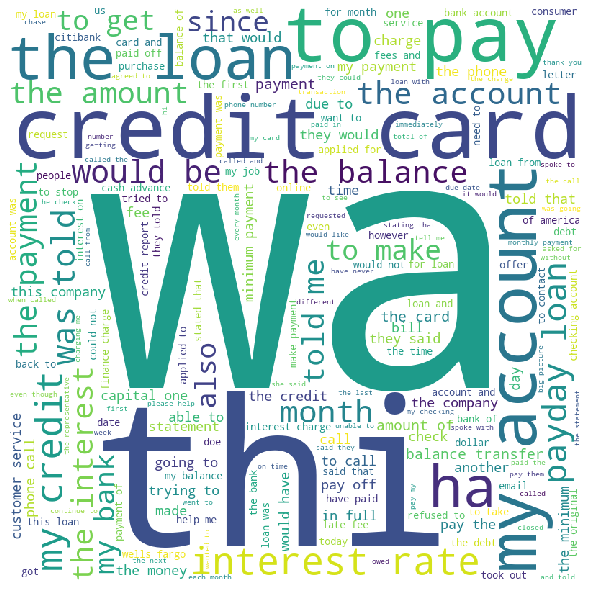

Cluster number: 2
experian has improperly shared my information with collection agency law firm not for the purpose of employment or extending credit i have been previously harassed by this law firm who manufactured documents for claimed debt and tried to sue me for debt released by class action lawsuit experian have improperly shared my information with at least such collection agencies who buy debt refuse to verify it manufacture documents

equifax has an account from and listed on my credit report i have disputed this with them i filed a complaint about the reporting company and they are not able to locate my account how can they report this account but can not find me in their system sufficient information was provided i have no knowledge of this account as i have never received any dispute letter as required by the fdcpa how can equifax allow a company to post something to my credit report without verification equifax has done this to me many times in the past and i have had to se

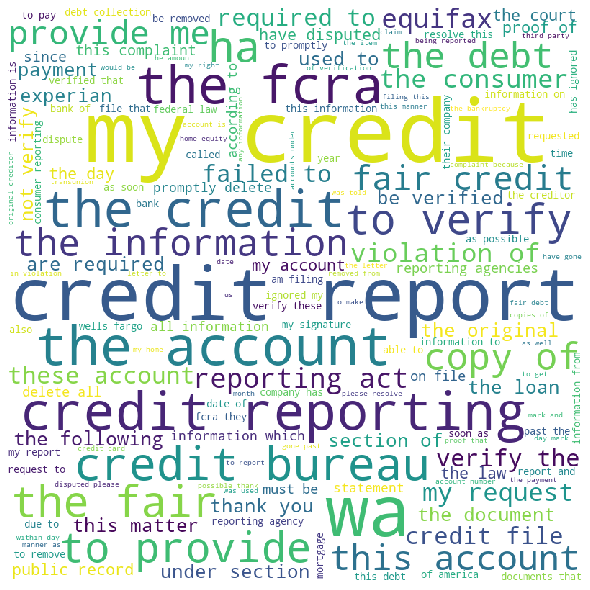

Cluster number: 3
i have a parent loan i got for my daughter to go to which is now closed and i feel should pay all the loans off for anyone that got a loan for that so called school but i can not afford the payments that i have for the loans no matter that they think i can i need to at least lower my payments

it s hard to believe the some other debt services that do n t have a better system while some of us are paying who are paying our bills with our continued original debt collection services are getting calls like these when they do n t know we have already chose them to make our payments 

i have a plus student loan serviced by navient i graduated in and since then my monthly bill has been outrageous the loan is in my mother s name since i was not allowed to take out a federal loan in my own name at the time i enrolled college because it is in my mother s name my monthly payment is calculated taking into account both her yearly income as well as my father s yearly income as both 

this company is continually harassing me by calling me six to seven times every day i do not wish to communicate with them and has written them letters on two different occasions to this 

signed up for an income driven repayment plan but was not told that i had to pay my late fees first before i could start the plan i asked numerous times if my payment would be the agreed upon amount and was assured everytime it would be when the bill came due it was higher because of the fees 

the people at navient jacked up my payment and even though they have been taking money out of my account they say i m behind in payments 

i am a victim of identity theft and federal loan servicing address keeps reporting on all credit reporting agencies as negative even though i contacted them directly with documents showing a suspect was arrested using my personal information to get loans credit and medical i also filed a complaint with the which told me to contact united states and or attention i will send 

Number of entries: 2352


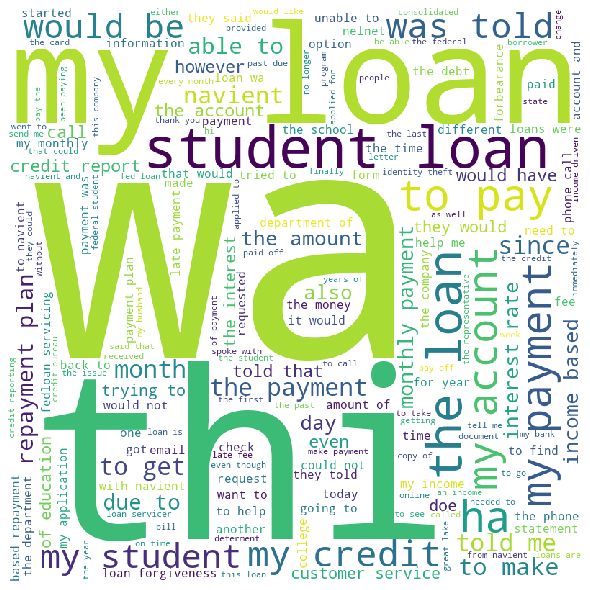

Cluster number: 4
the company i work for purchased several radio stations from a company selling off all it s inventory included with that sale was a pickup truck during closing the main focus was on all the regulatory paperwork with the fcc and other companies regarding the radio stations and transmitters and the was over looked until it was time to re register and re title the truck in the new companies name at that time it was noticed that we only had a copy of the title and not the original we worked with a previous of the company to get the required title paperwork willed out and notarized however the truck was originally financed through world omni finical corp and was paid off i have tried over a dozen times to contact world omni finical to get a letter stating that the truck is paid for and they have no further interest in it all i get for the several hours on hold is the run around with out anything ever happening we currently have a bill of sale a copy of the title showing it

i receiv a threating letter from ncb management service and threaing phone call s a bout a vehicle i do n t have 

in my auto finance company contacted my landlord and informed him they were looking for my vehicle and gave specific color and model also advised him it was delinquent and they would get a court order to enter the garage to retrieve it on the same day they also contacted a reference asking them to relay a message that they were calling about my vehicle that is past due when i called to speak to customer service they advised when a loan is delinquent they are allowed to give out this information in effort to locate and retrieve the vehicle 

i recently purchased a car my payment was due i was unable to make the payment on the finance company called me times the morning of i missed both calls so i called them back that afternoon i spoke with a representative and advised her i would make my payment on she asked me why i was late and i told her i asked her if i could change my

so my car was repossessed from fifth third bank they said i need to pay because of a late payment in i look back and that was when i had a deferment because my husband was out of work they told me to fill out a letter and send it in i have proof that i sent the email in and signed it they told me there would be an extra monthly payment added on to the loan now my car was repossessed and i had no idea why my car payment was sent through mail a little over a week before because they said i am not eligible for the online payment i called confused and they said once your payments go through then we can give you the release form then my husband called and they said we owed in repossession fees including the payments of on there way i was confused to why it was that much when my car payments are per month and when they are late so i called again to try and understand where this money came from and they said it was from when we missed a payment that s when i explained that was our month of de

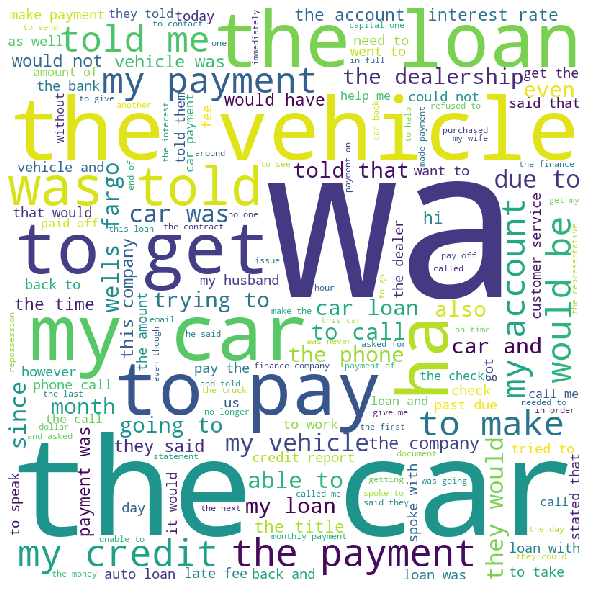

Cluster number: 5
have a mortgage at ocwen requested escrow analysis as taxes had decreased they sent an overage check and new escrow payment was lowered went to make mortgage payment today and my payment has increased by with no notification my taxes are only a year and they want to escrow a year for my taxes was on phone with them for one hour asked them why they never notified me of the change said that somebody cancelled the escrow analysis when i asked why they did not know i was under the impression i was to be given days notice prior to change in my mortgage payment and i was not this all happened my escrow balance is my taxes are by the time the collect monthly they will have collected over way more than needed so again i had to request an escrow analysis today so they can see their error i am complaining that they raised my mortgage payment without notification also my loan had been in a chapter that was discharged years ago several times i have asked them to correct their sys


i called specialized loan servicing to make a monthly payment and they refused to accept my payment i was told that they would not accept a payment of which is one month payment that the payment had to be one month payment + half a payment this is not the first time they refused to accept my payment in they accepted a payment of however in i was informed that they did not accept that payment and i needed to pay the new amount of an increase that i was not aware of i did pay the amount requested however it then put me at months behind in payments i have paid the up to this date and they have accepted the payment however today they refused to accept the payment which would put me at months behind i have been working with the loan modification department since 

i m following up on the complaint i originally submitted against wells fargo when they purchased my loan according to my legalsigned hud agreement they were to collect tax payments to pay my taxes they did not nor did they notify

Number of entries: 2397


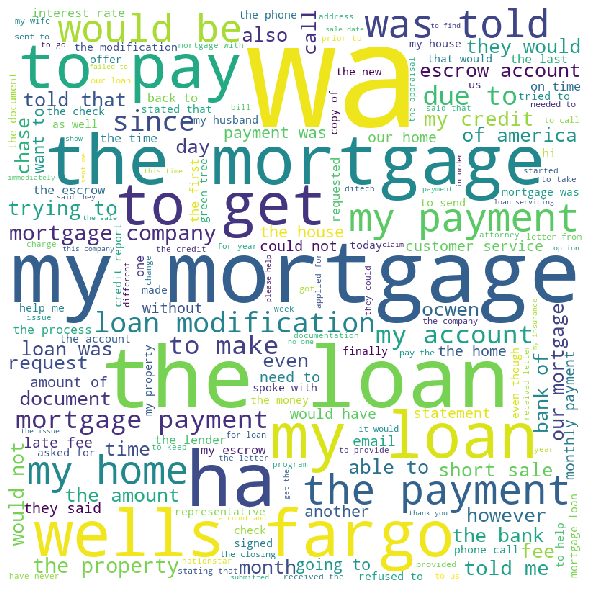

Cluster number: 6
chase keeps denying the use of my debit card and gives wierd reasons on how this is to secure my account it s been more than times in the past wekss i had my money locked in my account 

on us bank rep telephoned me and said my business account information was found on a known cyber criminal usb drive and an individual who was a target of a scam had my bank information and was instructed to pay account fraudulently i explain i had no knowledge of what he was talking about and that it was the first i heard of it and there were no irregular deposits into my account as he could verify he told me they would close my all my accounts and wire my funds to another bank which they did on on they reported report for suspected fraud activity this reporting caused banks to close my account until i can clear the matter i can not open a bank account anywhere because it appears like i was the one who committed fraud instead of someone illegally had my account information on a usb dr

on this day i called wellsfargo to close out my last checking account after calling the bank in request to close the account i noticed after minutes that my account s were still open and accessible online the account balance is with no balance owed however under transactions i show payoff debit non interest without fee when i called wellsfargo back to have the online account access deletedcancelledremoved and ask for a cancelclosed account receipt the bank refused to assist the bank customer service transfer me to a supervisor by the name of who repeated that the bank would n t assist with sending me a cancelclosed account receipt via email fax or usmail i informed her that this is the reason why i m leaving wellsfargo this request is reasonable and is doable in the branch i informed her that i would be filing a complaint as nothing i m request is unreasonable i m trying to protect my identity the bank wellsfargo has refused to take steps to protect me as a consumer and this is the rea

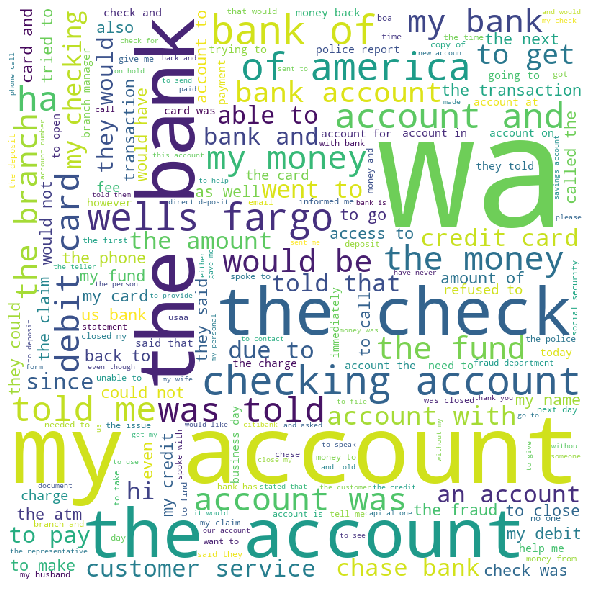

Cluster number: 7
someone used my paypal account and linked checking account to make transactions not authorized by me happened on for from code and on for from notes saying code paypal was able to refund the first but closed the second with nothing found i changed passwords since then today on getting the resolution i was again not able to log into paypal and had to reset passwords again simple search for site may be hacked this looks like a broad issue where someone tried and was able to move the money outside us and now paypal is not helping looking into issue i dont have any way to disconnect my bank from paypal and paypal allows people to pull money from bank instead of cc even my setting is to use cc first this is unauthorized and i dont even know these peoplefirmcompany or ordered anything from them i need help to resolve and get my money back 

i am filing this complaint about pnc bank for what i believe to be confusing marketing practices aimed at tricking existing pnc mortgag

i am a who has banked with bank of america for more than years in the last year the service charges for banking services that allretailers require have been increased anywhere from to thesare critical services like cash deposits coin requests check writing andcheck deposits ach activities etc our monthly bank fees not includingcredit card fees have gone from approximately per store per year one year agto over per store per month this year

chase bank will not accept my payment on my safe deposit box in their branch in which i have submitted twice through chase online bill pay and now are charging a late fee for nonpayment the box is located in but as i now live two hours away in i have paid online twice st i sent the payment through chase online bill pay to the same address i d used before and where it had been accepted previously that check was returned as they claimed they had no account i next talked to customer service who directed me to send it to a d address and assured i would n

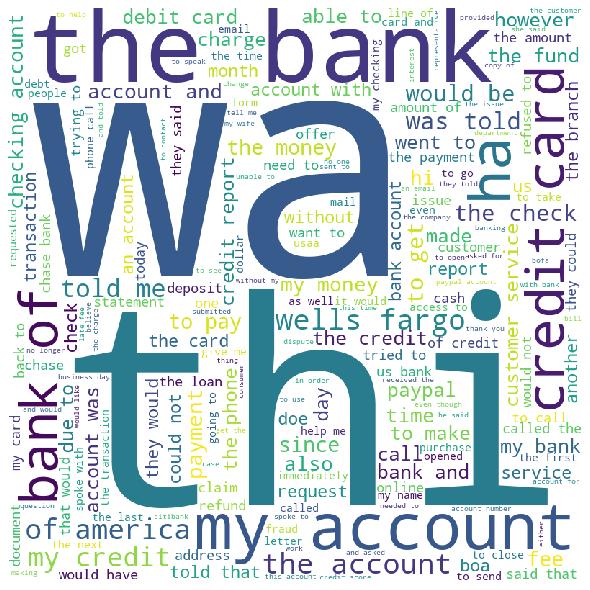

Cluster number: 8
today my car was repossessed by the loan agency springleaf financial after i ve been making payments to them when i called their corporate office they kept giving me the run around on things and seemed to not be able to get their own story straight i am currently weeks i was laid off for months from my old employer after they had found out i was i recently was able to get income generated and i explained that to springleaf they were very inconsiderate i knew i was behind on payments but i have been doing my best to catch up on my payment going in to my local office to make payments on weekly basis with whatever money i had even if that meant me not being able to eat for the rest of the week everytime i step into the local branch office where i live the associates are extremely rude and are usually out back smoking and not even at their desks springleaf has told me i can only pay cash and i m now beginning to wonder if they have been pocketing my hard earned money i ha

 equifax date dear sir or madam the sole purpose of this letter is to inform you i have been a victim of identity theft i am further requesting that you block the following fraudulent information from my credit reports so that i can proceed accordingly with my file once more i want to emphasize none of the information stated below relates to any transaction that i have made na the items listed are clearly fraudulent therefore i am requesting that they are deleted blocked by name of source in addition a cra must block the fraudulent information and the victim must be identified within four business days after accepting hisher identity theft report when it accepts the identity theft report the cra also must notify the furnishers of the fraudulent information that the victim has filed the report that the report states that the information they furnished resulted from identity theft and that it is blocking the information that they furnished fcra b b u s c c b iii a blocking information in

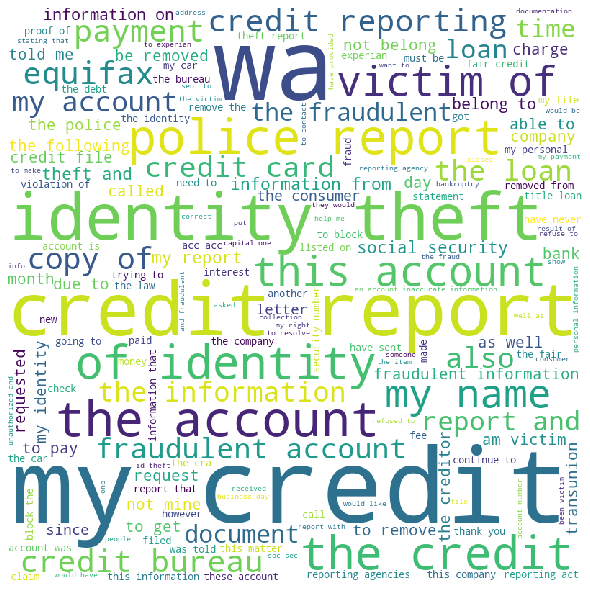

Cluster number: 9
upon change from one job to another i promptly informed the lender that my pay cycle has changed and i would require a change of my billing dates to that i was told no problem and representative took note of future pay dates and loan payment cycle however vendor continued to bill on regular cycle causing overdrafts and fees 

i did n t pay off my credit card in full last month the bill was and i paid off normally we always pay this bill off completely when i calculated the interest we would owe i based it on the remaining amount due when i received my statement for i discovered i was charged interest on the amount i had already paid plus the amount i did n t yet pay is a credit card able to charge interest on an amount i do not owe a second question i was planning on paying the remaining amount off today prior to the due date that s why i m catching this now if i pay the amount of off today is the same amount of interest charged my annual rate is does n t annual mean 

Number of entries: 2437


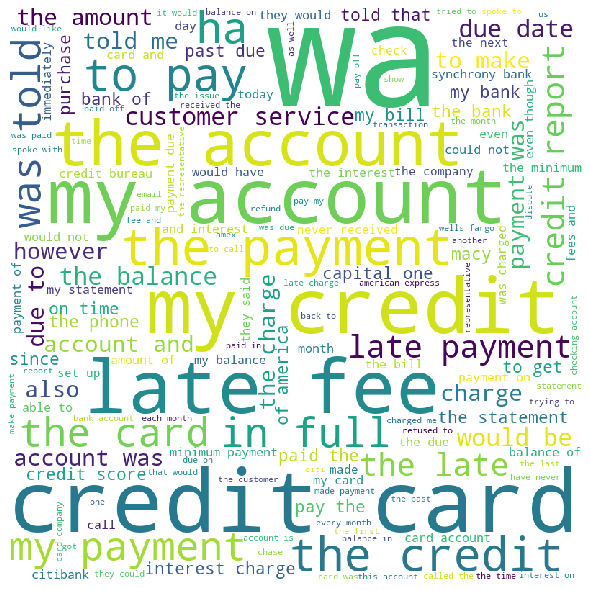

Cluster number: 10
we had a credit from a credit card company citi bank that was allegedly refunded by check on that never reached us we have called numerous times talking to numerous agents and supervisors and 

this loan was initiated with a bank in which then sold the loan to which then sold the loan to which then sold it to green tree servicing llc this last transfer happened in the first fall out of the mortgage lending crunchbad debtspeople losing homes etc before all of the programs to help owners keep their homes when i realized i could no longer keep the house i tried to place it with rental management companies in but no possibilities there i then tried through green tree servicing llc to have them take the houseloan back but was told that since i had moved out of the house and out of the state and gone where rent was less expensive that it was now rental property and did n t qualify for them to take the property over i contacted a realtor that specialized in short sales but 


applied for a consolidation from chase using a appraised property as collateral i felt from the beginning they were doing things to undermine us getting the loan because of our age or ethnicity first they underestimated our income so the debt ratio was over the limit when we brought this to their attention they added the payment of plus that the say we are deficient in rental income to the debt again to put us back over the debt ratio the debt we would have after the loan would only be our house note and the loan note that they calculated to be as you can see we have sufficient income to pay the note based on the their debt calculation whether we collect rent or not 

i went through this awhile back bank of america lost my mortgage to the tune of they would not do anything to set it right they were to busy because they were selling a bank in the other bank was a shady one also how can the let this go in our country got to go now steamed up again 

i am unsure what kind of debt this is

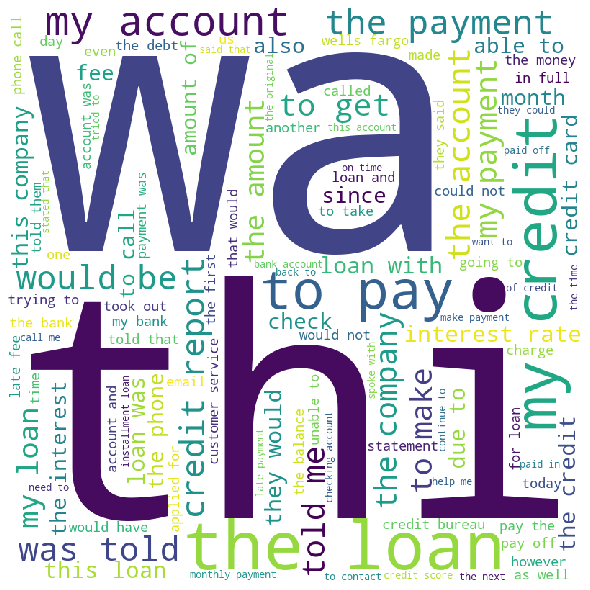

Cluster number: 11
this mortgage company is the absolute worst company that i have ever dealth with i have been going back forth with them for months regarding my hazard insurance on my account i have had hazard ins on my account from day one i have supplied this information to ocwen every year and it was never an issue ocwen changed the requirement and i was never informed they stated that they sent a letter to me i have never received that until one week ago when it was emailed to me from the executive team that i placed a complaint to please note that i spoke to a ocwen representative and they advised that the letter was sent to another address not my address they then changed my address in the account i was advised that i am now required to have hazard ins on my indwelling of my property i purchased the additional ins when i was advised of the change and provided the ins proof to ocwen this complaint is simply that ocwen placed hazard ins for my indwelling on my account and escrowe

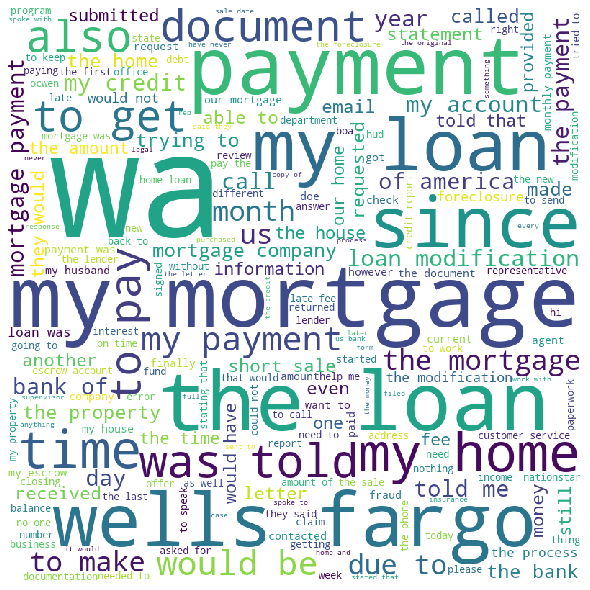

Cluster number: 12
in trying to negotiate a payment plan on debt on a wells fargo credit card and though i m still willing to pay the full amount of the debt the representative consistently said that they could not advise how this would affect my credit i insisted on knowing how a payment agreement would affect my credit prior to making a decision on whether to accept the terms but they could not say how it would be reported i feel i have the right to know before i agree to terms and they said i could contact the credit bureau s to ask them but i know the reporting comes from the lending entity not the credit bureau 

i am disputing unfair and deceptive credit bureau reporting information against creditor capital one i had settled in full my charged off credit card account with a debt a collector called on the manager at assurred me that once my account was paid the information would be provided to capital one at which time the account would also reflect the same type of reporting to t


they are reporting bankruptcy to all credit buros eqifax and the information is incorrect it says it was discharged in but it was discharged in that s years from now it was chaper which should only stay on years the most this is hurting me from getting a house for my kids n i and i have reestablished credit over the years and this is still coming up the credit report company s are sending no proof to back up there claim i want it removed at once or ill sue

experian continues to post a public record that does not belong to me they shows it as remaining and have not followed up with the county record of deed they do not have a tax lien for me 

i disputed the account listed on my credit file experian responded stating they updated information when i reviewed the information the payment history on the account makes no sense the report the account with late payments in then charged off in then suddenly begin reporting late payments again of days late the suddenly begin reporting the acco

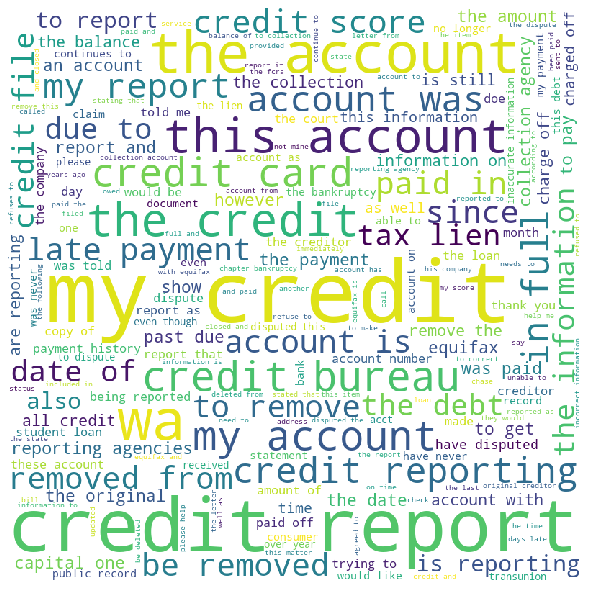

Cluster number: 13
this office is calling me numerous times a day to my self my home phone my spouses phone and also calls me at work when i have notified them not to contact me at work i refuse to speak with them because they are very rude and demanding on the phone 

i graduated from in i have accumulated so much debt in i consolidated all my loans with the department of education through to my suprise i have received a summons from a client that i owed private loan in the amount of approimately i was not aware of scamming me to believing that my loans were consolidative now i am stuck with paying loan that i had no idea signing in the name of financial aid degree is not worth anything i could not even get a i can not pay different student loans at the same time scam me and now i am stuck with unnecessary bills and being sued times by the creditors i do not know what to do now have cause me serious pain and my credit is destroy because of judgement on my credit history i need them to

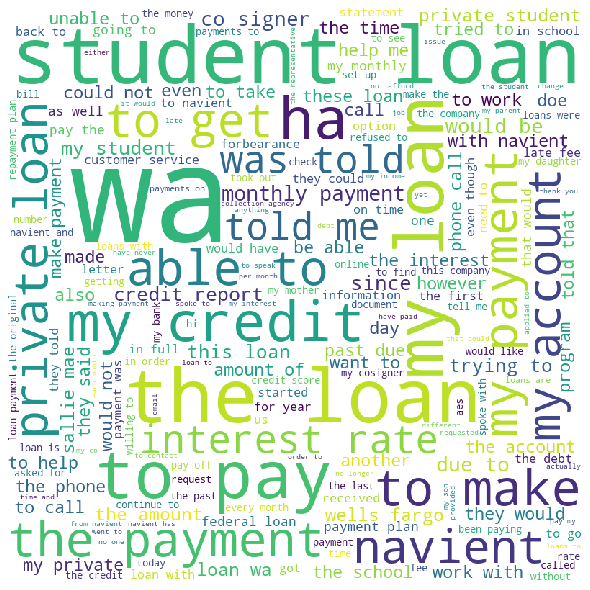

Cluster number: 14
on sunday i was called by cash central in utah a company i ve never heard of the caller a woman named said that she was following up on an lending inquiry i had made online i repeatedly told her that i never made any inquiry and i repeatedly asked how and where she got my name and number she would not answer i asked for a supervisor and was connected with a woman named i told her that i had never contacted or even heard of cash central ever in my life and i demanded to know where and how they got my information she would not tell me the next day monday i received an alert from my credit monitoring company informing me that credit reports were taken out on me today from cash central and from i have not applied for any service from either of these companies ever and i want to know who is doing so in my name i have filed a with on monday 

on bank of america closed out my credit card account and re opened it within a short time frame causing an unauthorized hard inquiry

Number of entries: 2980


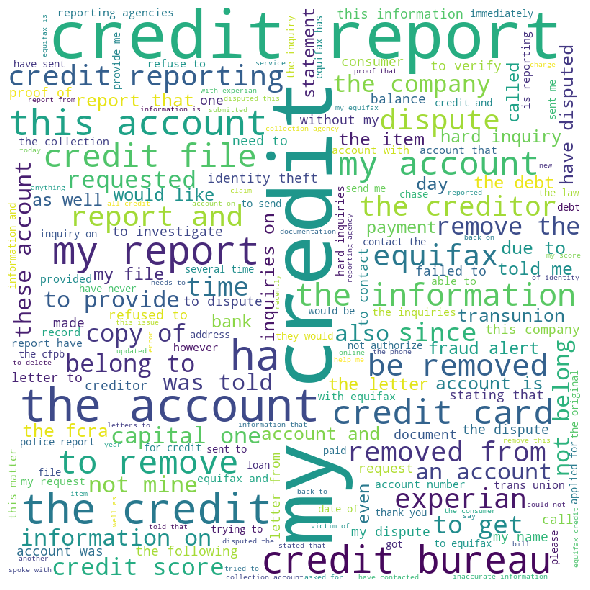

Cluster number: 15
i received a flyer from american express asking me to sign up for a business credit card and spend win months to receive points when i tried to use the code and sign up online their website kept telling me it was having problems and to call and sign up when i did so i made sure the representative was signing me up under the reward points code after fulfilling the spend requirement i noticed i was only given points i contacted amex numerous times being told that although they confirmed i was offered the point offer that i was signed up under point offer this is fraud they intentionally enticed me with the point offer then ensured i had to call instead of signing up online where i could have verification of the correct offer the rep told me that they make everyone call then switched offers after verbally telling me i was getting the points classic bait and switch 

hello this is regarding mc issued by acc i bought an online ad placement on shortly after that the websit

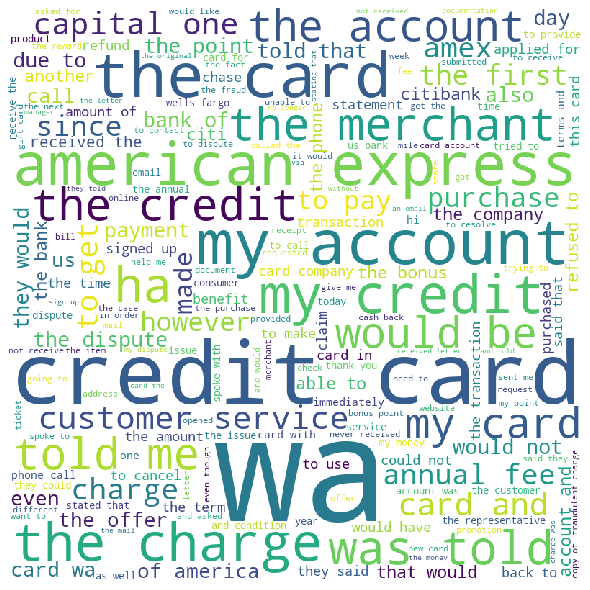

Cluster number: 16
i received a pre paid citi card debit due to a large purchase of a dishwasher the card was a pre paid card i assumed that i could only charge and that would deplete the card to zero any additional amount that takes me beyond the limit should be declined however that is not the case apparently these pre paid cards are being sold as a pre paid card when in fact you can go negative on your balance essentially charging more than the limit you are given citi prepaid says that this happens if there is a charge pending and another charge hits while the other is pending irrelevant in my opinion this is fraudulent and should not be allowed to happen i had to speak to different people with different companies to try to resolve this citi prepaid customer support and the corporate office that they transferred me to i was transferred back and forth disconnected times and spoke with different supervisors no one could resolve my issue i have a negative balance on my card of consume

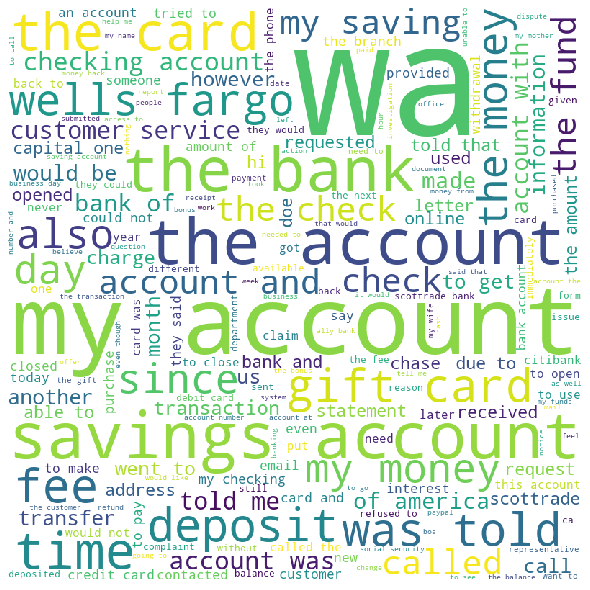

Cluster number: 17
since i approximate that i have had at least different amex cards those would be personal credit cards i own so maybe another or i know my husband has had at least i have had access to amex credit cards in the last years i was so grateful to have so many credit cards because those cards were what enabled me to juggled the finances of my and maintain financial sanity at home so when i was trying to book some delta flights for my son and a friend to fly to for a scouting event my husband to attend a family friend s funeral and an employee s flight for a weeklong conference i was amazed by the lack of empathy on the part amex over the last months i have had a false tax lien placed against me by the state of department of taxation i am still trying to have it removed from but and have both deleted it from their records i found out we had a tax lien while i was applying for a va refinance loan we were told that we did n t qualify due to our loan because of our credit scor

it has been months since i filed a complaint with cfpb regarding a questionable transaction with a local car dealer see case number to this date cfpb has still not been able to locate the company known as so it could be registered notified and given days to respond to this dispute which is holding up the resolution and removal of the repossession claim from our credit report on my wife spoke with our lender who suggested we call at my wife talked to at about our situation as i listened she gave my wife phone numbers for and and said these were the numbers showing up on our credit report for this dispute when my wife called the number they told her they were a tax accounting firm and had nothing to do with cars or car loans when my wife called the number at answered the phone my wife asked for the phone number to and flat out refused to give it to her but instead transferred her to a man named answered the phone my wife asked who he was with told her he was the owner of and that he just

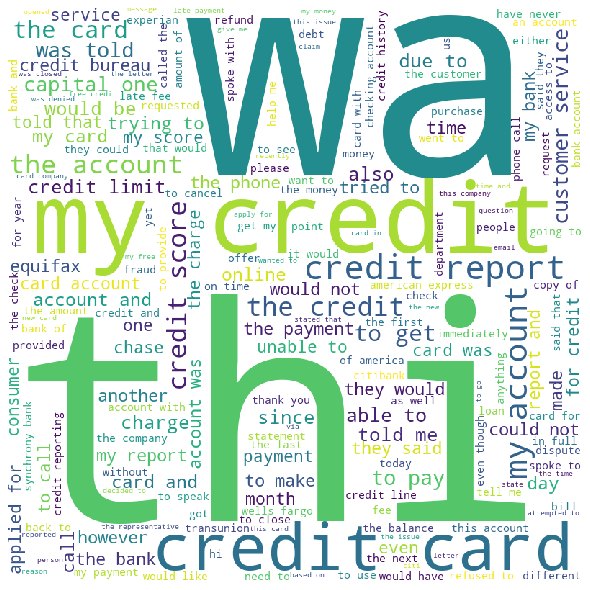

Cluster number: 18
i sign on with clearone advantage debt settlement program when i signed on with a rep name i asked several questions about this program in the conversation the questions asked several times if there will be a fee link to this service times i was told we never charge a fee now i am being charge a fee each time a creditor is paid then she indicated do no worry we will handle everything contact creditors sure they are taken care of they did not explain that in order for the creditors to be paidsettled that i had to reverse money in order to start working with them now i am face with a creditor wanting to send me to collection because of their false information 

i signed up with nationwide biweekly administration a service based in oh to make biweekly payments to my mortgage company on my behalf in and was charged an initial fee with the promise that over the life of their service to me i would end up saving more than that amount of money in saved interest just months l

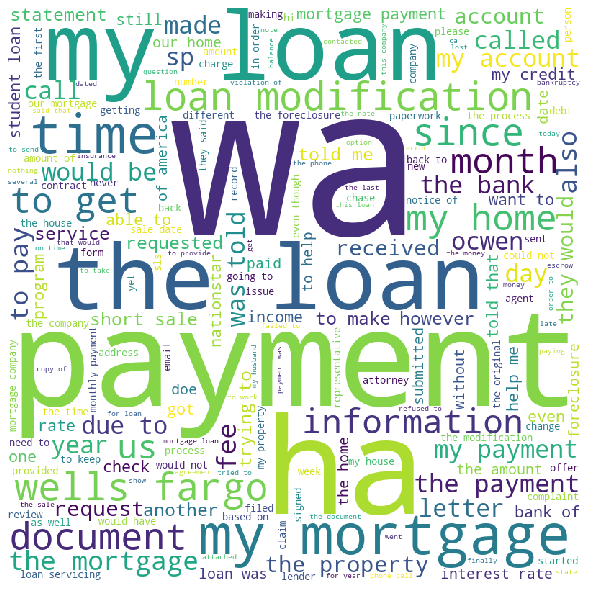

Cluster number: 19
ally is reporting to and that the closed date of my account is in the charge off date was in the charged off account is paid ally continues to provide false and misleading information to and regarding my account with them i agreed to pay the disputed amount and expected accurate credit reporting 

being charged on an account that was closed in good standing purchased auto after lease paid in full never any missed payments no outstanding liens with the state it was purchased

Number of entries: 1100


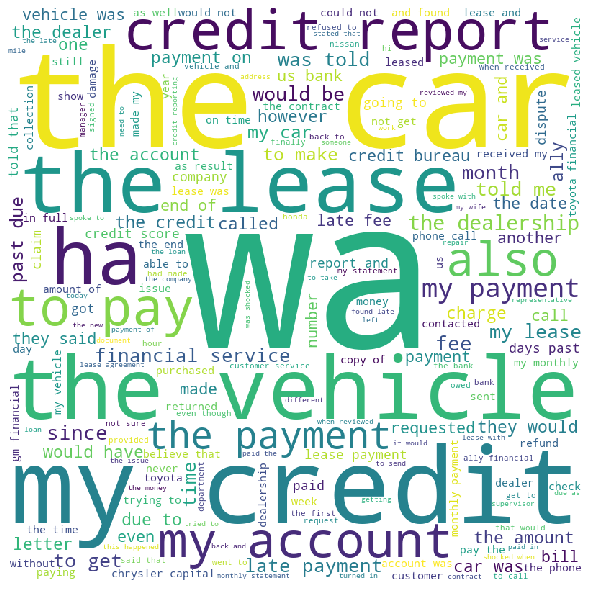

Cluster number: 20
i have been with rushcard for over years as of late they have held my money for over a week and refuse to give me a time frame on when my money will be released i am a full time college student and have daily expenses that i can not take care of now because they refuse to release my money 

i have a rushcard prepaid debit card on which my funds have been deposited to for the past years as of i started having problems accessing my account i understood that the company was having computer issues i have made a total of calls to rushcard with only calls actually connecting to live people after hours of being of hold when i spoke with the first representative i explained that my account balance was incorrect and that their were pending items on the account which were actually paid on she checked the account and confirmed that i was correct she stated that she would put in a request for corrections to be made after days the balance was still the same so i tried calling aga

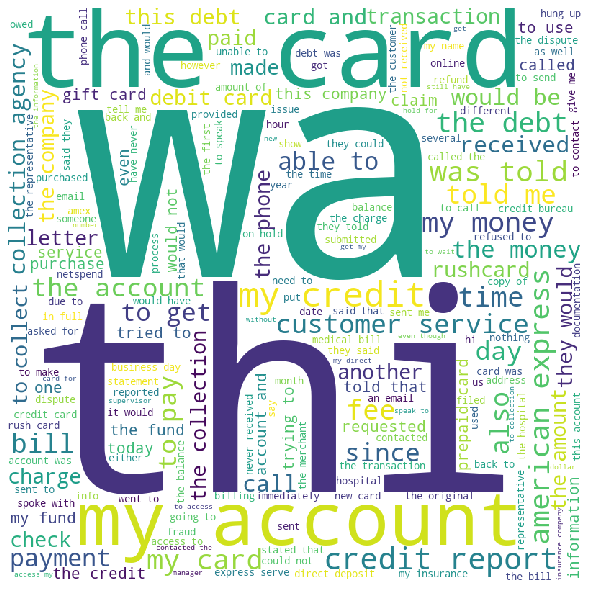

Cluster number: 21
wells fargo has a post on my wells fargo account i have a mortgage with wells fargo wells fargo has been notified multiple times i did not sign a mortgage with them the documents show my signature is not on the mortgage i have an attorney i want it immediately removed from my credit reporting agency and my wells fargo account this is fraud i am prepared to take this fraud to the media this fraud needs to be removed immediately to prevent further legal actions i did not sign a mortgage with wells fargo for mortgage 

on i went to the drive through at the branch i provided the mortgage payment stub from the bottom of the statement and a check for to the teller and after additionally providing my husbands social security number she provided me with a receipt which i put into my purse without looking at we received an initial escrow analysis statement dated which showed our mortgage was going up to from we then received a billing statement dated which indicated our mortg

i continue to receive unsolicitedunwelcomed threatening phone calls from a company only known as r p m collection agency phone who refuse to share any information with me as to the nature of their business or who it is they are representing instead i m asked personal questions or they simply hang up the phone i have been extremely patient in this matter but i have reached my level of tolerance with these unwanted disturbances

while checking my personal credit report i noticed an unauthorized and fraudulent credit inquiry made by on or about on experian i did not authorized anyone employed by this company to make any inquiry and view my credit report has violated the fair credit reporting act section b c they were not legally entitled to make this fraudulent inquiry this is a serious breach of my privacy rights i have requested that they mail me a copy of my signed authorization form that gave them the right to view my credit within five business days so that i can verify its validity 

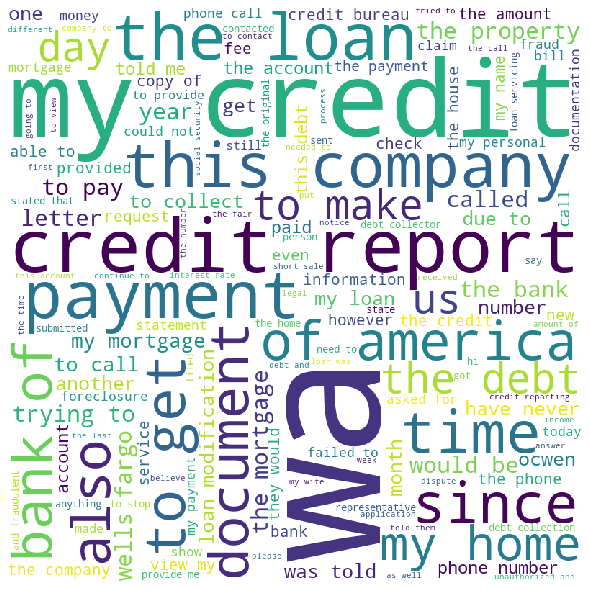

Cluster number: 22
i need someone to address this issue expeditiously two years ago the turn our account account over to a unethical unlawful collection agency that harass you and tell lies to get money out of americans who has loans with the something needs to be done about the company asap there name is pioneer credit recovery they are a collection agency out of new york that does bad business practices in they took my tax refund because they lied and told the that my was a student loan something needs to be done about this company asap send out a stop and decease letter asap these people are misrepresenting the which is a federal agency pioneer credit recovery needs to be stopped by the government for misrepresentation of government loan accounts on last friday my job gave me some papers that will be giving a collections the right to garnish my wages after i sent them in supporting documents explaining my financial condition in the letter pioneer credit recovery sent to your ofice t

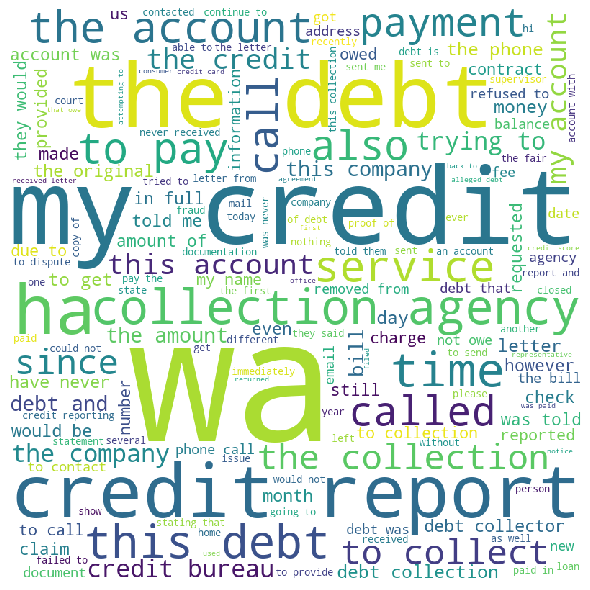

Cluster number: 23
 i listed and sold an item computer game on ebay for to a new ebayer named sent payment to my paypal account paypal deducted transaction fees leaving with with a i sent the item computer game unlock code via ebay message to complete transaction paypal alerted me the credit card used by was a fraudulent and unauthorized charge thus they initiated a chargeback against me pp opened a dispute and asked that i supply them with proof of my delivery of the game code which i did paypal found i had sent the item but was not protected because of their tos indicating i sent a nontangible item a game code which unlocked the game from the developer allowing a one time download of the product pp then tacked on a charge of to an unrelated purchase i made from another retailer of and deducted that combined amount from my credit card note my credit card is a backup service as all normal deductions of my purchases normally go through my attached checking account as a debit pp did the 

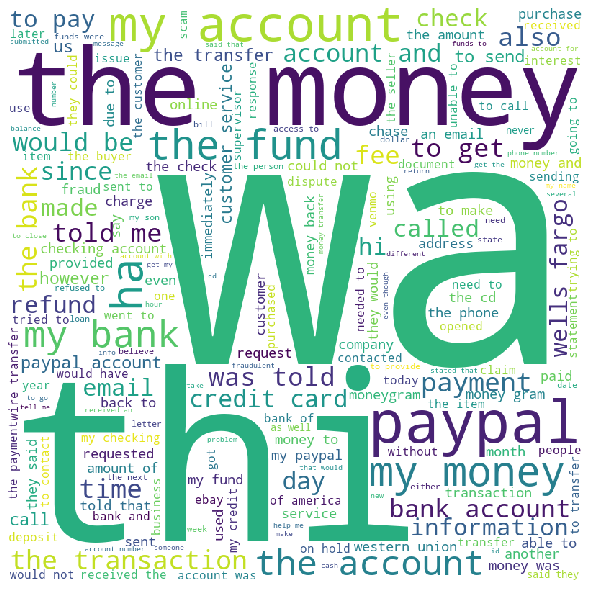

Cluster number: 24
a few months ago i received a voice message apparently was about my barclay credit card i returned their call to clarify the matter but the person i talked to started to ask for my personal information including my ssn knowing that i do n t have any credit card with barclay i readily said that i am not giving any information about myself because i do n t have any credit card with barclay and i have no intention of applying for i continue to receive phone calls from them in which i did not pay attention for obvious reasons until i heard another voice mail that it was now under fraud investigation out of curiosity i again returned their call when i asked about the fraud investigation the guy again started to ask for my personal information which i refused i told him that i do n t have any credit card issued by barclay and if there are applications under my name they should not approved them on i received a mail from certain dated informing me that their investigation h

Number of entries: 2653


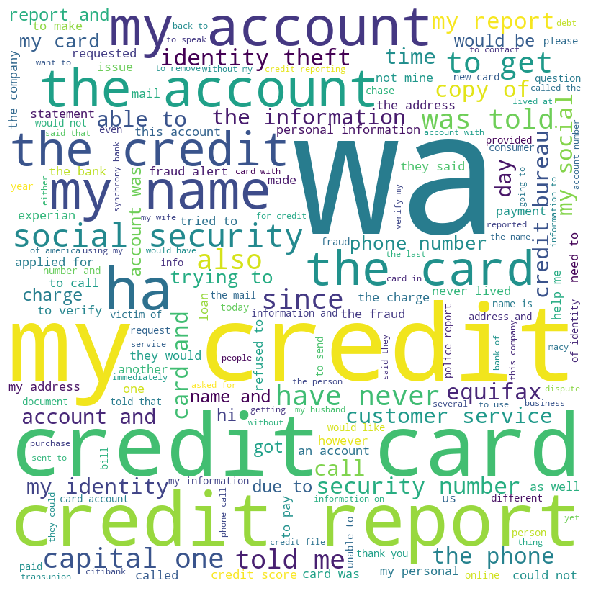

Cluster number: 25
when trying to change the account from which my monthly payments were automatically drawn from i was given untrue information from pnc bank which ended with payments being late and thus affecting my credit score i have tried working with pnc to resolve the issue but it has not been successful i m simply looking for the recorded phone calls i ve had with pnc to be reviewed to prove their error and my credit score to be adjusted accordingly 

i m not sure if this needs to be a complaint or just an answered question anyway my wife and i went to a car dealership on my wife gave them an application for a car was told it was approved and she signed the paperwork and we left in the car i was not part of any of the paperwork application nor did i give any of my information days later i noticed i had credit inquiries where that dealer send my info for credit to different banks i immediately called them and they denied doing so in fact the sales manager put me on speaker phone

good afternoon i purchased a from in nc since the purchase of the car i have been and transferred my duty station from to i had not realized that i was delinquent in my payments and that the car payments were not current during this time my mom who lives in is helping me straighten out the payments i also told the finance company that my mom had my authorization to call and talk to them regarding the loan due to my job and training i can not always be available to accept phones calls or call out to follow up after my mom reviewed the auto contract she believed i was a possible victim of predatory lending due to the interest rate being so high and she also how i even qualified for the loan on separate occasions my mom called and asked them to confirm what my monthly income was on both occasions said it was now it s no long a question of how i qualified this is fraud on behalf of my monthly income is only a month we asked to send a copy of the document they received from and both times t

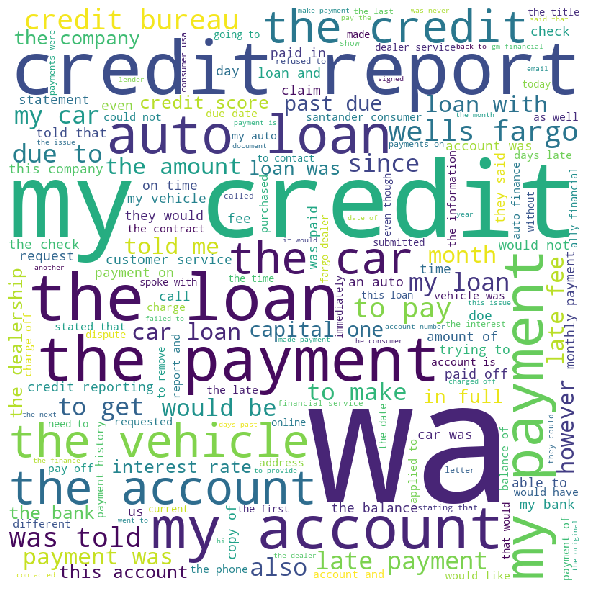

Cluster number: 26
on my husband went to wells fargo to send a wire transfer to in wells fargo sent the wire wrong and the funds were never received by on monday i went to wells fargo to find out what happened and why did not receive the money it was discovered that the banker had used the wrong number i was told that the funds would be recalled and sent to the right place and this would happen within hours days worst case which would have been thursday i specifically asked what would happen if wells fargo could not get the money back i was told that wells fargo would send the money and take it as a loss on friday the funds had still not been received so my husband went back to wells fargo they told him that they would put the money back in our account next week and we would have to resend the wire completely disregarding what they initially said they would do to correct the problem i told the company in that they would have the money by thursday because wells fargo promised that it wo

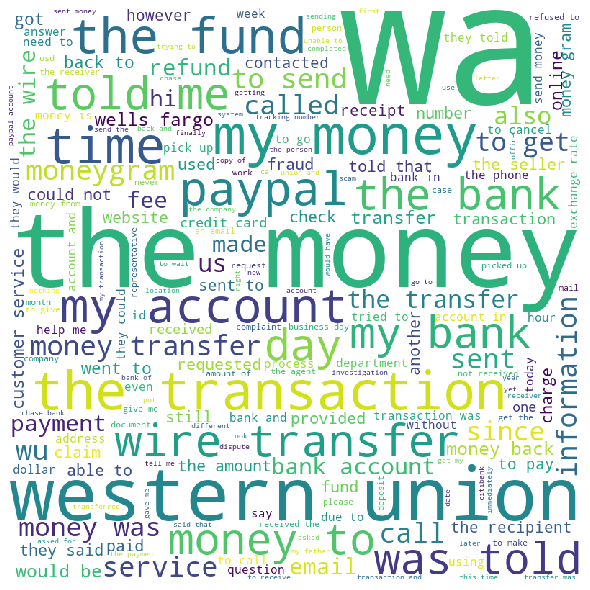

Cluster number: 27
i was mailed a notice fro m finex group llc collection services the notices were mailed on and these notices prompted me to reach out to this collection agency in a attempt to explain this debt did not belong to me i explained that they should pursue the party who is responsible for the unpaid tow fees from i assured them that i sold this vehicle and completed a release of liability form to the dmv i explained that i had several incidents pertaining to fees owed related to this vehicle that i ve since reconciled due to the documented proof of my release of liability both and have accepted my release of liability document as sufficient proof i ve been discharged from any responsibility to pay in both matters pertaining to the same vehicle and same registration issue these companies have made efforts to pursue the party who is at fault however with all the matters discussed and issues presented at the table finex group llc has done things contrary to the other business

i am joint owner on my year old daughter s saving and checking account at navy federal credit union only for the purposes of assisting her when needing to handle transactions as it pertains to her college education i found out today that this financial institution transferred from my personal account i have with them to my daughters overdrawn account when i inquired as to the reason i was told that a signed disclosure justified the transfer i have no issue with the signed disclosure my issue as explained to the representative was the amount by which nfcu allowed my daughters account to become overdrawn by the amount of money taken from my personal account to cover this overdrawn balance is a hefty amount for me and was to be used to pay my own personal obligations i had my daughter pull up her account information and the account was allowed to go into overdrawn status since and with her working on a part time basis she paid for these discrepancies the charges were for purchases she mad

all events took place over the internet on last friday i performed a transaction which would debit one of my checking accounts for after i completed it and within the hour i realized that my profile at the application site where i completed the transaction had my bank of america account this account did not have the balance to cover the debit but i proceeded to do an internal account transfer which was successfully processed bank of america posted the debit amount on the same day but held pending the credit to cover it via the transfer until and causing an overdraft charge i called bofa on and spoke with rep aundrea or apologies if i got the name wrong who at the end despite of that i asked for a courtesy refund insisted to tell me that it was not an error since bofa processes the transaction immediately after the customer provides their routing and account numbers to the website regardless of whether a transfer deposit to cover is done even within a second i found the situation to be 

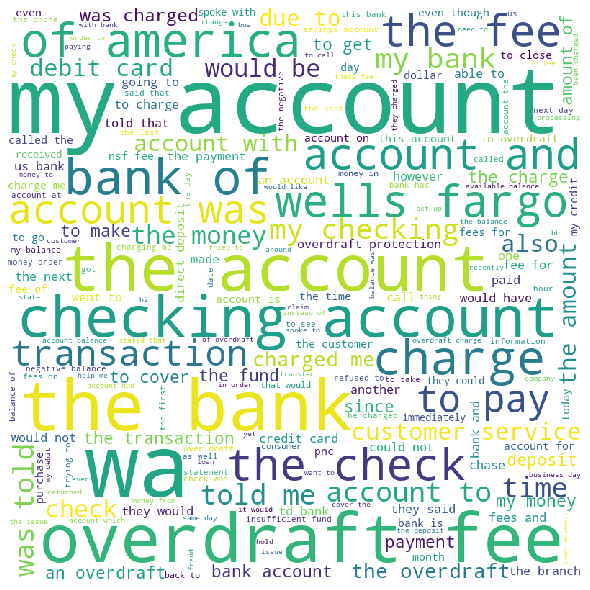

Cluster number: 28
i have no knowledge of this debt 

i received a letter from stating that i owe for a creditor company name on behalf of i am up to date on my mortgage payments to so therefore do not owe this money 

on i received a phone call from of the frontline collection agency stating that a previously held joint credit card from the time of my marriage was still in existence insisted the outstanding balance was my responsibility as my name was on the acacount during my marriage he requested that i put the outstanding balance on a credit the day of the call incorrectly reported the outstanding amount due as being i informed that this was not my debt and that i had no obligation to pay the debt i requested the information be sent to me in writing which did the email i received further added that the debt must be paid by which had not previously been mentioned and legal action was threatened i have no reason to believe there is any joint account subsequent to my divorce a propert

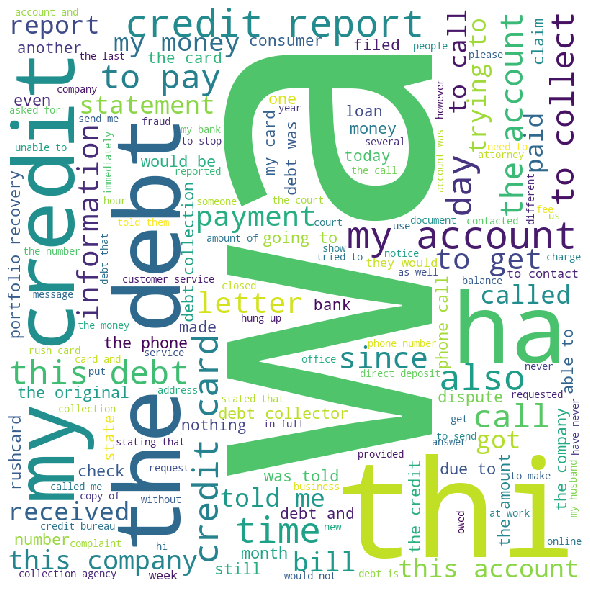

In [12]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,200)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 
